#  🐶 End-to-end Multli-class Dog Breed Classification

This notebook builds an end-eo-end multi-class image classifier using TensorFlow 2.0 
and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

When I'm sitting at the cafe and I take aphotot of a dog, I want to know what breed of dog it is.

## 2. Data
The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation
The evaluation is a file with predictions probabilities for each dog breed of each test image.

https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features
Some information about the data:

* We're dessaling with images (unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dog (this means there are 120 different classes).
* There are around 10,000+ images in the training set (these inages have labels).
* There are around 10,000+ images in the set(these images have no labels, because we'll want to predict them).

# Get our workspace ready

* Import TensorFlow 2.x
* Import TensorFlow Hub
* Make sure you are using a GPU

## Getting our data ready (turning into Tensors)

With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into Tensors (numerical representations). 

Let's start by accessing our data and checking out the labels.

In [1]:
# Import TensorFlow into colab
import tensorflow as tf
import tensorflow_hub as hub
print("TF version: ", tf.__version__)
print("TF Hub version: ", hub.__version__)

# Check for GPU availability
print("GPU", "available (YESSSSSS!!!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :()")

TF version:  2.10.0
TF Hub version:  0.13.0
GPU available (YESSSSSS!!!!!!!)


In [2]:
# Checking the labels of our data
import pandas as pd
labels_csv = pd.read_csv("labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [3]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

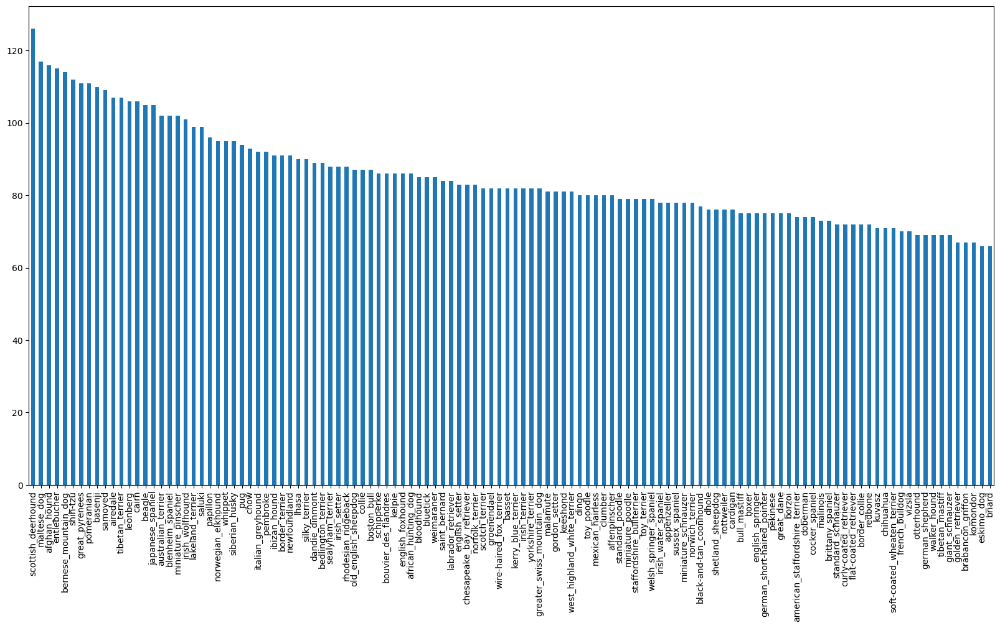

In [4]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10))

In [5]:
labels_csv["breed"].value_counts().median()

82.0

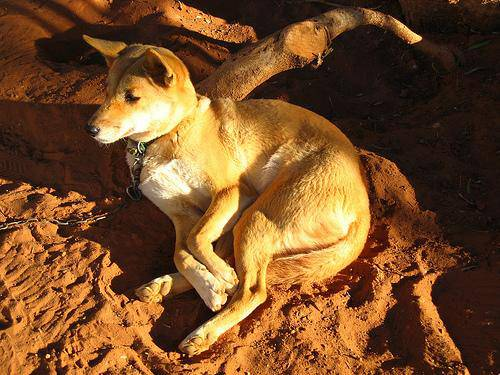

In [6]:
# Let's view  an image
from IPython.display import Image
Image("train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

Let's get a list of all our image file path names 

In [7]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [8]:
# Create path names from image ID's
filenames = ["train/"+ fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames[:10]

['train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'train/001cdf01b096e06d78e9e5112d419397.jpg',
 'train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'train/002a283a315af96eaea0e28e7163b21b.jpg',
 'train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [9]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("train/")) == len(filenames):
  print("Filenames match actual amount of files!!! Proceed.")
else:
  print("Filenames do not match actual amount of files, check the target directory.")

Filenames match actual amount of files!!! Proceed.


In [10]:
len(os.listdir("train/"))

10222

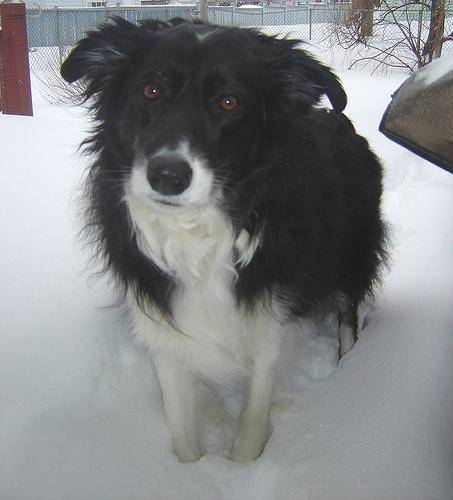

In [11]:
# One more check
Image(filenames[10052])

In [12]:
print(len(filenames))

10222


In [13]:
labels_csv["breed"][10052]

'border_collie'

In [14]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels) # does same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [15]:
len(labels)

10222

In [16]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames")

Number of labels matches number of filenames!


In [17]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [18]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [19]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [20]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2] 

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [21]:
len(boolean_labels)

10222

In [22]:
# Example turning boolean array into integers
print(labels[0]) # original labels
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample lable occurs

boston_bull
(array([19], dtype=int64),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [23]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [24]:
filenames[:10]

['train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'train/001cdf01b096e06d78e9e5112d419397.jpg',
 'train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'train/002a283a315af96eaea0e28e7163b21b.jpg',
 'train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [25]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

### Creating our own validation set
Since the dataset from Kaggle doesn't come with a validation set, we're going to create our own.

In [26]:
# Setup X & y variables
x = filenames
y = boolean_labels

We're going to start off experimenting with ~1000 images and increase as needed.

In [27]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:100000}

In [28]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)
len(x_train), len(y_train), len(x_val), len(y_val)

(800, 800, 200, 200)

In [29]:
# Let's have a geez at the trainig data
x_train[:5], y_train[:2]

(['train/00bee065dcec471f26394855c5c2f3de.jpg',
  'train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, Fa

## Preprocessing Images (turning images into Tensors) 
To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image filepath as input 
2. Use TensorFlow to read the file and save it to a variable, 'image'
3. Turn our 'image' (a jpg) into Tensors.
5. Resize the 'image'to be a shape of (224, 224)
6. Return the modified image.

In [30]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [31]:
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  5

In [32]:
image.max(), image.min()

(255, 0)

Now we've seen what an image looks like as a Tensor, let's make a function to prepocess them.
1. Take an image filepath as input 
2. Use TensorFlow to read the file and save it to a variable , 'image'
3. Turn our 'image' (a jpg) into Tensors. 
4. Normalize our image (convert color channel values from 0-255 to 0-1).
5. Resize the 'image' to be a shape of (224, 224)
6. Return the modified 'image'.

More information onmloading images in TensorFlow can be seen here: https://www.tensorflow.org/tutorials/load_data/images

In [33]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """

  # Read in an image file
  image = tf.io.read_file(image_path)
  # turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224,224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches
Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go... they all might not fit into memory.

So that's why we do about 32 (this is the batch size) images at a time (you can manually adjust the batch size if need be).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which liik like this: (image, label)

In [34]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a typle of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [35]:
# Demo of above
(process_image(x[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form: (image, label), let's make a function of our data(x & y) into batches! 

In [36]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Create batches of our data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data nut dosn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches....")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x)))   # Only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

# If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches.....")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),    # filepaths
                                                 tf.constant(y)))   # labels

    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches......")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data =  data.map(get_image_label)

    # Turn the training data into batches 
    data_batch = data.batch(BATCH_SIZE)

  return data_batch

In [37]:
# Create training and validation data batches
train_data = create_data_batches(x_train, y_train)
val_data = create_data_batches(x_val, y_val, valid_data=True)


Creating training data batches......
Creating validation data batches.....


In [38]:
# Check out the different attributes of our batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualizing Data Batches

Our data is now in batches, however these can be little hard to understand/comprehend, let's visualize them!

In [39]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure 
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    #plt.axis("off")

In [40]:
train_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

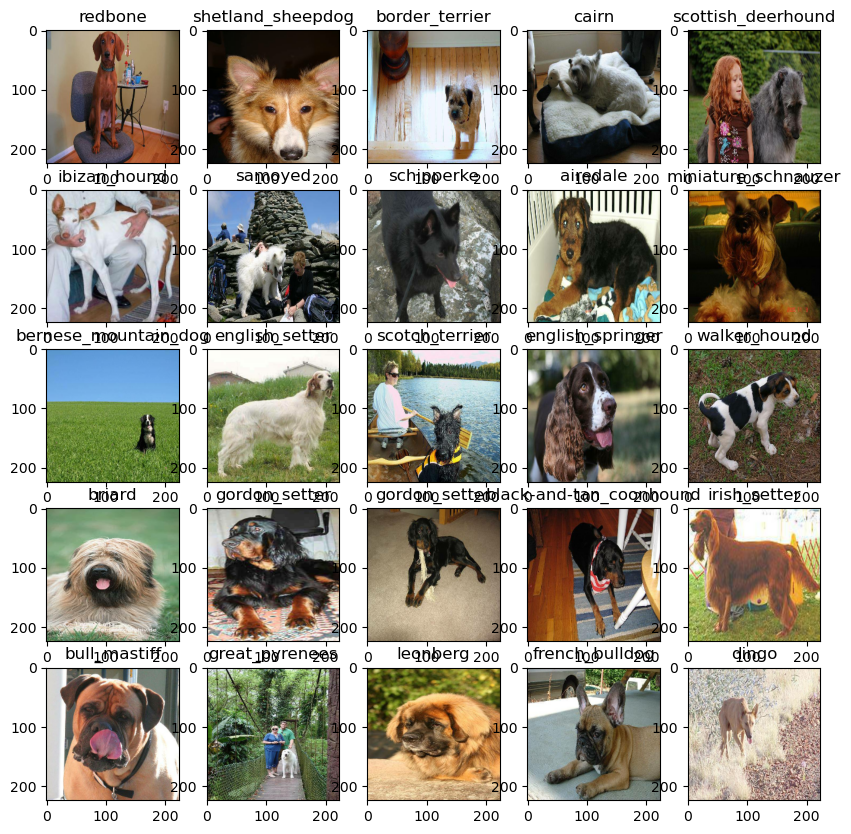

In [41]:
# Now let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels) 

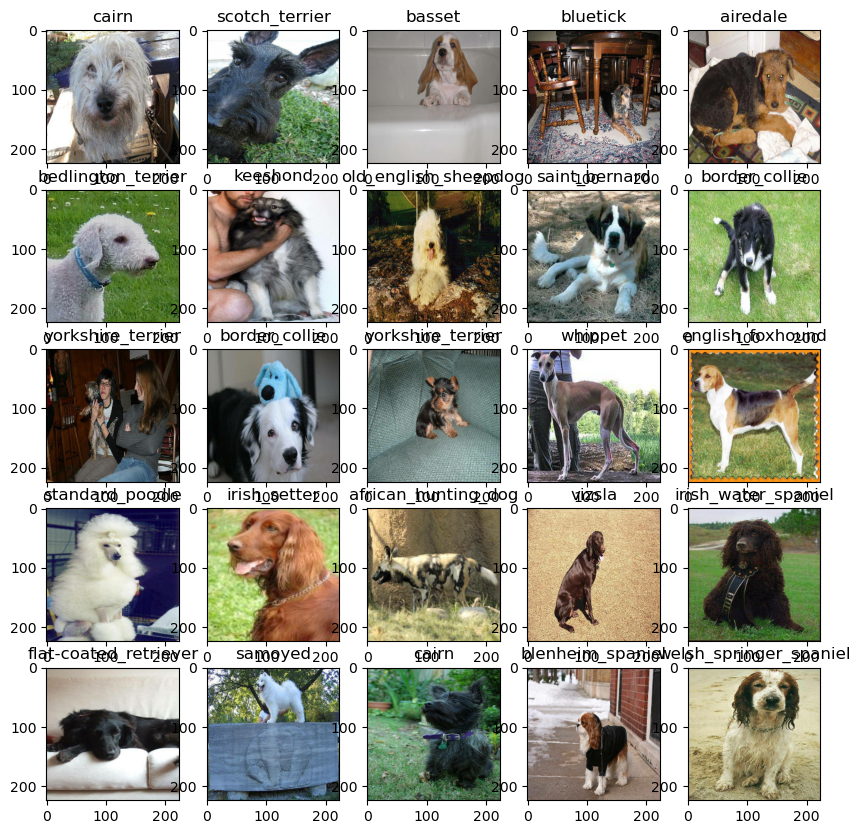

In [42]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model 
Before we build a model, there are a few things we need to define:
* The input shape (our image shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use.

In [43]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]   # batch, height, width, colur channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Now we've got our inputs, outputs and model ready to go.
Let's put them togethor into a Keras deep learning model!

Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

All of this steps can be found here: https://www.tensorflow.org/guide/keras/overview

In [44]:
# Create a funtion which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with: ", MODEL_URL)

  # Setup the model 
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL),    # Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax")   # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  ) 

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [45]:
model = create_model()
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


# Creating Callbacks
Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving. 

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

# TensorBoard Callback
To setup TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notwbook which is able to save logs.
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's fit() function.
3. Visualize our model training logs with the %tensorboard magic function (we'll do this after model training).  

In [46]:
# Load TendoBoard notebook extension
%load_ext tensorboard

In [47]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("log",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stoping Callback
Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [48]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

# Training a model (on subset of data)
Our first model is only going to train on 1000 images, to make sure everything is working.

In [49]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10} 

In [50]:
# Check to make sure we're still running on a GPU
print("GPU", "available (YESSS!!!!!!!!!)" if tf.config.list_physical_devices("GPU") else "not available")

GPU available (YESSS!!!!!!!!!)


Let's create a function which trains a model.
* Create a model using create_model()
* Setup a TensorBoard callback using create_tensorboard_callback()
* Call the fit() function on our model passing it the training data, number of epochs to train for (NUM_EPOCHS) and the callbacks we'd like to use.
* Return the model.

In [51]:
# Buils a function to train and return trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model

In [52]:
# Fit the model to the data
model = train_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


Epoch 1/100
25/25 [==============================] - 16s 199ms/step - loss: 4.5303 - accuracy: 0.1037 - val_loss: 3.4768 - val_accuracy: 0.2350
Epoch 2/100
25/25 [==============================] - 3s 108ms/step - loss: 1.6043 - accuracy: 0.6862 - val_loss: 2.1421 - val_accuracy: 0.5000
Epoch 3/100
25/25 [==============================] - 3s 105ms/step - loss: 0.5555 - accuracy: 0.9375 - val_loss: 1.6591 - val_accuracy: 0.5700
Epoch 4/100
25/25 [==============================] - 3s 107ms/step - loss: 0.2475 - accuracy: 0.9900 - val_loss: 1.4789 - val_accuracy: 0.6050
Epoch 5/100
25/25 [==============================] - 3s 107ms/step - loss: 0.1439 - accuracy: 0.9975 - val_loss: 1.4055 - val_accuracy: 0.6450
Epoch 6/100
25/25 [==============================] - 3s 109ms/step - loss: 0.0994 - accuracy: 1.0000 - val_loss: 1.3587 - val_accuracy: 0.6500
Epoch 7/100
25/25 [==============================] - 3s 109ms/step - loss: 0.0749 - accuracy: 1.0000 - val_loss: 1.3235 - val_accuracy: 0.635

**Question:**It looks like our model is overfitting because it's performing far better on the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning nueral networks?

**Note:** Overfitting to begin with is a good thing! It means our model is learning!!!

### Checking the TensorBoard logs

The TensorBoard magic function ('%tensorboard') will access the logs directory we created earlier and visualize its content. 

In [53]:
%tensorboard --logdir log

Reusing TensorBoard on port 6006 (pid 16556), started 0:44:38 ago. (Use '!kill 16556' to kill it.)

# Marking and Evaluating predictions using a trained model


In [54]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [55]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 76ms/step


array([[9.98912263e-04, 7.08842344e-05, 6.11439522e-04, ...,
        2.85120768e-04, 3.47845744e-05, 1.00346580e-02],
       [8.81171972e-03, 7.47962622e-04, 1.05321435e-02, ...,
        9.10091121e-03, 8.31247424e-04, 8.86350244e-05],
       [6.52788276e-06, 1.89565384e-04, 3.41120722e-06, ...,
        6.40373182e-05, 3.83183760e-05, 6.94062328e-04],
       ...,
       [1.07817932e-05, 2.12568862e-04, 2.13950829e-04, ...,
        3.05675421e-05, 8.03038347e-05, 2.13691048e-04],
       [1.76026567e-03, 2.80666602e-04, 2.27577824e-04, ...,
        1.04628154e-04, 2.84900852e-05, 8.20743386e-03],
       [2.91673641e-04, 2.08654801e-05, 4.44149016e-04, ...,
        5.40767750e-03, 3.86426371e-04, 6.55789627e-05]], dtype=float32)

In [56]:
np.sum(predictions[0])

1.0

In [57]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[2.06766650e-04 2.01423991e-05 3.10113428e-05 5.66965464e-05
 2.29757046e-03 3.50161135e-05 9.22750551e-05 3.78011406e-04
 1.00047635e-02 3.09895165e-02 1.37195184e-05 3.97096082e-05
 3.89733235e-04 6.99310889e-03 4.77545982e-04 3.37963481e-03
 1.41838327e-05 3.54079151e-04 4.41138982e-05 3.85793624e-04
 7.64958168e-06 8.40782770e-04 5.60201406e-05 5.31856967e-05
 4.85314010e-03 3.09307143e-05 8.57829800e-05 1.09246481e-04
 3.64852458e-04 5.19603891e-05 2.39313249e-05 8.86046691e-05
 4.53560679e-05 6.55558615e-05 1.26426412e-05 3.10636460e-05
 2.33309678e-04 3.34889482e-04 1.84639983e-04 5.01377523e-01
 2.91604141e-04 6.42359300e-05 7.45934015e-03 7.91404545e-06
 9.76410665e-05 1.50024298e-05 3.00647545e-04 5.68300136e-04
 1.78748105e-05 3.91896232e-04 3.40275474e-05 1.86039339e-04
 2.97649007e-04 5.92987635e-04 2.93857993e-05 1.74975401e-04
 1.40356628e-04 2.00445538e-05 1.07082902e-04 2.02872543e-05
 3.09012285e-05 7.50716950e-04 2.02598385e-05 2.57723987e-05
 2.27674245e-04 1.023248

In [58]:
unique_breeds[113]

'walker_hound'

Having the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probabilities are also known as confidence levels.

In [59]:
# Turn predictions probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

  # Get a prediction label based on an array of prediction probabilities
  pred_label = get_pred_label(predictions[81])
  pred_label


Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [60]:
val_data


<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [61]:
# Create a function to unbatch a batch dataset 
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns seperate arrays of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [62]:
get_pred_label(val_labels[0])

'affenpinscher'

In [63]:
images_ = []
labels_ = []

# Loop through unbatch data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)
  print(label)

images_[0], labels_[0]

[False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False  True False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False]
[False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False F

[False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False  True False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False]
[False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False F

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [64]:
get_pred_label(labels_[0])

'cairn'

In [65]:
get_pred_label(predictions[0])

'cairn'

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some function to make these all a bit more visualize.

We'll create a function which:
* Takes an array of rpediction probabilities to a predicted label.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, it's predicted probability, the truth label and the target image on a single plot. 

In [66]:
def plot_preds(prediction_probabilities, labels, images, n=1):
  """
  View the predictions, ground truth, and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"
        
  # Change plot title to be predicted, probability of prediction, and true label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)


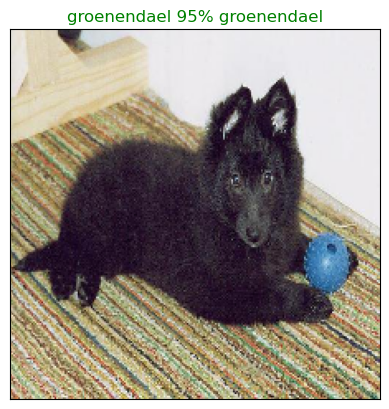

In [67]:
plot_preds(prediction_probabilities=predictions,
           labels=val_labels,
           images=val_images,
           n=77)

Now we've got one funtion to visualize our model's top prediction, let's make another to view our models top 10 predictions.

This function will:

    * Take an input of prediction probabilities array and a ground truth array and an integer
    * Find the prediction using get_pred_label()
    * Find the top 10:
        * Prediction probabilities indexes
        * Prediction probabilities values
        * Prediction labels
    * Plot the top 10 prediction probability values and labels, coloring the true label green 

In [68]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
    """
    Plus the top 10 highest prediction confidences along with the truth label for sample n.
    """
    pred_prob, true_label = prediction_probabilities[n], labels[n]
    
    #  Get the predicted label
    pred_label = get_pred_label(pred_prob)
    
    # Find the top 10 prediction confidence indexes
    top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
    # Find the top 10 predictions confidence values
    top_10_pred_values = pred_prob[top_10_pred_indexes]
    # Find the top 10 prediction labels
    top_10_pred_labels = unique_breeds[top_10_pred_indexes]
    
    # Setup plot
    top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                       top_10_pred_values,
                       color="grey")
    plt.xticks(np.arange(len(top_10_pred_labels)),
              labels=top_10_pred_labels,
              rotation="vertical")
    
    # Change the color of true label
    if np.isin(true_label, top_10_pred_labels):
        top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
    else:
        pass

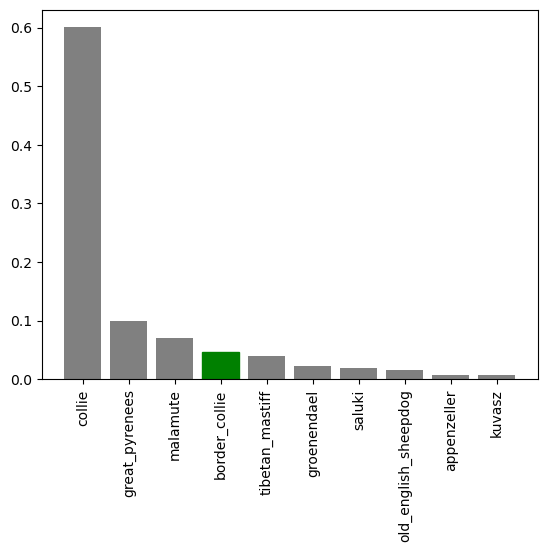

In [69]:
plot_pred_conf(prediction_probabilities=predictions,
              labels=val_labels,
              n=9)

In [70]:
predictions[0]

array([9.98912263e-04, 7.08842344e-05, 6.11439522e-04, 4.01985562e-05,
       1.16944379e-04, 2.99817148e-05, 1.21229589e-02, 1.06388784e-03,
       7.82105999e-05, 8.48692434e-04, 4.16464783e-04, 5.05746168e-04,
       9.11821437e-04, 1.18943550e-04, 4.93663189e-04, 1.03867112e-03,
       1.00317389e-04, 8.73375311e-02, 1.09647890e-05, 4.85873607e-05,
       1.13531423e-03, 1.70038038e-04, 2.73574860e-05, 8.21274240e-04,
       3.78998629e-05, 5.42435853e-04, 2.99765170e-01, 5.33468483e-05,
       1.01049873e-03, 1.53016750e-04, 2.30736026e-04, 6.84199156e-04,
       2.15192544e-04, 1.67788730e-05, 1.17441785e-04, 6.88696876e-02,
       2.00657141e-05, 1.31786149e-03, 6.26467008e-05, 3.52157585e-05,
       8.13416380e-04, 2.74822451e-05, 4.22756595e-04, 8.28111079e-04,
       2.68000094e-05, 7.30467873e-05, 5.38597887e-05, 2.43939518e-04,
       2.50991929e-04, 1.20921650e-04, 2.62652902e-05, 2.51595029e-05,
       4.39295924e-04, 1.33693451e-04, 2.84491562e-05, 2.44295352e-05,
      

In [71]:
predictions[0][predictions[0].argsort()[-10:]]
               
# This line just make the array in decending order
predictions[0][predictions[0].argsort()[-10:][::-1]]

array([0.29976517, 0.12427744, 0.08733753, 0.07330055, 0.07243136,
       0.06886969, 0.04104043, 0.03969892, 0.024895  , 0.02423371],
      dtype=float32)

In [72]:
unique_breeds[predictions[0].argsort()[-10:][::-1]]

array(['cairn', 'lhasa', 'border_terrier', 'soft-coated_wheaten_terrier',
       'tibetan_terrier', 'dandie_dinmont', 'irish_wolfhound', 'komondor',
       'maltese_dog', 'silky_terrier'], dtype=object)

Now we've got some fuction to help us visualize our predictions and evaluate our model, let's check out a few.

In [73]:
def plot_pred(prediction_probabilities, labels, images, n=1):
    """
    View the predictions, ground truth and image for sample n
    """
    pred_prob, truth_label, image = prediction_probabilities[n], labels[n], images[n]

    # Get the pred label
    pred_label = get_pred_label(pred_prob)

    # Plot image & remove ticks
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])

    # Change the color of the title depending on if the prediction is right or wrong 
    if pred_label == truth_label:
        color = "green"
    else:
        color = "red"

    # Change plot title to be predicted, probability of prediction and truth label
    plt.title("{} {:2.0f}% {}".format(pred_label,
                                      np.max(pred_prob)*100,
                                      truth_label),
                                      color=color)

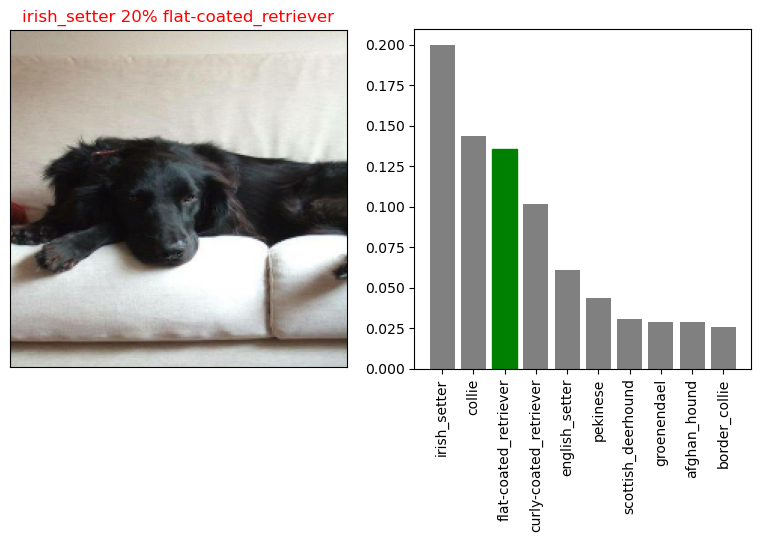

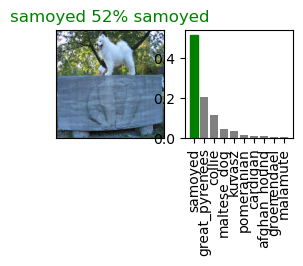

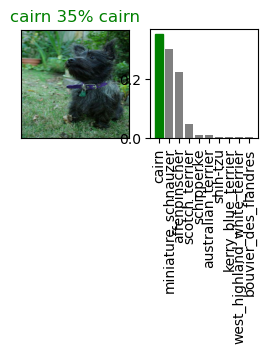

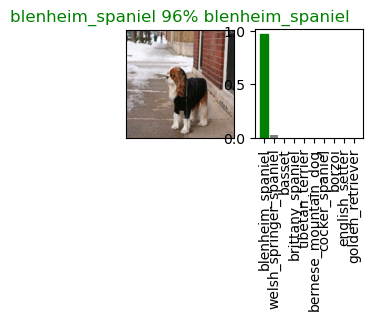

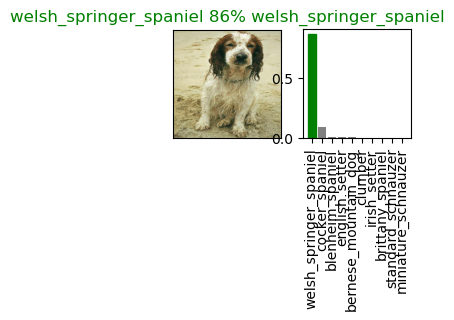

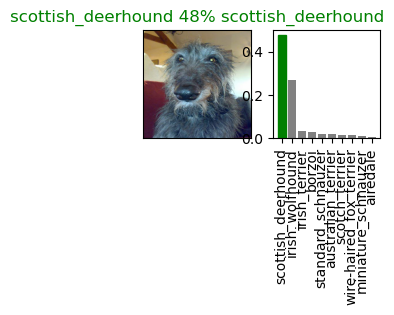

In [74]:
# let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
    plt.subplot(num_rows, 2*num_cols, 2*i+1)
    plot_pred(prediction_probabilities=predictions,
             labels=val_labels,
             images=val_images,
             n=i+i_multiplier)
    plt.subplot(num_rows, 2*num_cols, 2*i+2)
    plot_pred_conf(prediction_probabilities=predictions,
                  labels=val_labels,
                  n=i+i_multiplier)
    #plt.tight_layout(h_pad=1.0)
    plt.show()

**Challenge:** How would you create a confusion matrix with our models predictions and true labels?

# Saving and reloading a trained model

In [75]:
import os

current_directory = os.getcwd()
print("Current directory:", current_directory)

Current directory: c:\Users\vatsa\Downloads\machine_learning\dog-breed-identification


In [76]:
import os
import datetime

def save_model(model, suffix=None):
    """ 
    Saves a given model in a models dictionary and appends a suffix (string). 
    """
    # Create a model directory pathname with current time
    modeldir = os.path.join("model", datetime.datetime.now().strftime("%Y%m%d-%H%M"))
    model_path = modeldir + "-" + suffix + ".h5"  # save format of model
    print(f"Saving model to: {model_path}...")
    model.save(model_path)
    return model_path

In [77]:
# Create a function to load a trained model 
def load_model(model_path):
    """
    Loads a saved model from a specified path. 
    """
    print(f"Loading saved model from: {model_path}")
    model = tf.keras.models.load_model(model_path,
                                      custom_objects={"KerasLayer": hub.KerasLayer})
    return model

Now we've got functions to save and load a trained model, let's make sure they work!

In [78]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: model\20230816-1738-1000-images-mobilenetv2-Adam.h5...


'model\\20230816-1738-1000-images-mobilenetv2-Adam.h5'

In [79]:
# Load a trained model
Loaded_1000_image_model = load_model("model/20230701-1512-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: model/20230701-1512-1000-images-mobilenetv2-Adam.h5


In [80]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 74ms/step - loss: 1.2115 - accuracy: 0.6900


[1.211545467376709, 0.6899999976158142]

In [81]:
# Evaluate the loaded_model
Loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 73ms/step - loss: 1.2549 - accuracy: 0.6850


[1.2549197673797607, 0.6850000023841858]

# Training a big dog model (on the full data)


In [82]:
len(x), len(y)

(10222, 10222)

In [83]:
x[:10]

['train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'train/001cdf01b096e06d78e9e5112d419397.jpg',
 'train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'train/002a283a315af96eaea0e28e7163b21b.jpg',
 'train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [84]:
len(x_train)

800

In [85]:
y[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [86]:
# Create a data batch with the full data set
full_data = create_data_batches(x, y)

Creating training data batches......


In [87]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [88]:
# Create a model for full model
full_model = create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [89]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set whentraining on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

**Note:** Running the cell below will take a little while 

(maybe up to 10 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [90]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard ,full_model_early_stopping])

Epoch 1/100


320/320 [==============================] - 31s 83ms/step - loss: 1.3412 - accuracy: 0.6644
Epoch 2/100
320/320 [==============================] - 26s 81ms/step - loss: 0.3969 - accuracy: 0.8809
Epoch 3/100
320/320 [==============================] - 27s 84ms/step - loss: 0.2367 - accuracy: 0.9366
Epoch 4/100
320/320 [==============================] - 26s 82ms/step - loss: 0.1545 - accuracy: 0.9611
Epoch 5/100
320/320 [==============================] - 27s 83ms/step - loss: 0.1062 - accuracy: 0.9808
Epoch 6/100
320/320 [==============================] - 26s 82ms/step - loss: 0.0762 - accuracy: 0.9880
Epoch 7/100
320/320 [==============================] - 26s 81ms/step - loss: 0.0585 - accuracy: 0.9920
Epoch 8/100
320/320 [==============================] - 26s 81ms/step - loss: 0.0461 - accuracy: 0.9942
Epoch 9/100
320/320 [==============================] - 26s 82ms/step - loss: 0.0369 - accuracy: 0.9965
Epoch 10/100
320/320 [==============================] - 26s 82ms/step - loss: 0.0309 

In [91]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: model\20230816-1747-full-image-set-mobilenetv2-Adam.h5...


'model\\20230816-1747-full-image-set-mobilenetv2-Adam.h5'

In [92]:
# Load the full model
loaded_full_model = load_model("model/20230701-2020-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: model/20230701-2020-full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test dataset 

Since our model is trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created 'create_data_batches()' earlier which can take a list of filenames as input and conver them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames
* Convert the filenames into test data batches using 'create_data_batches()' and setting the 'test_data' parameter to 'True' (since the test data dosn't have labels).
* Make a predictions array by passing the test batches to the predict() method called on our model.

In [93]:
import os
test_path = "test"
test_filenames = [os.path.join(test_path, fname) for fname in os.listdir(test_path)]
test_filenames[:10]

['test\\000621fb3cbb32d8935728e48679680e.jpg',
 'test\\00102ee9d8eb90812350685311fe5890.jpg',
 'test\\0012a730dfa437f5f3613fb75efcd4ce.jpg',
 'test\\001510bc8570bbeee98c8d80c8a95ec1.jpg',
 'test\\001a5f3114548acdefa3d4da05474c2e.jpg',
 'test\\00225dcd3e4d2410dd53239f95c0352f.jpg',
 'test\\002c2a3117c2193b4d26400ce431eebd.jpg',
 'test\\002c58d413a521ae8d1a5daeb35fc803.jpg',
 'test\\002f80396f1e3db687c5932d7978b196.jpg',
 'test\\0036c6bcec6031be9e62a257b1c3c442.jpg']

In [94]:
len(test_filenames)

10357

In [95]:
test_filenames[:4]

['test\\000621fb3cbb32d8935728e48679680e.jpg',
 'test\\00102ee9d8eb90812350685311fe5890.jpg',
 'test\\0012a730dfa437f5f3613fb75efcd4ce.jpg',
 'test\\001510bc8570bbeee98c8d80c8a95ec1.jpg']

In [96]:
# Create test data batch 
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches....


In [97]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling predict() on our full model and passing it the data batch will take a long time to run.

In [98]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 27s 83ms/step


In [99]:
test_predictions[:10]

array([[3.4363332e-12, 9.9567533e-13, 8.0199402e-17, ..., 9.0807920e-15,
        1.9876198e-10, 1.3502234e-11],
       [1.3656963e-06, 2.8111441e-07, 2.8795046e-09, ..., 2.1780305e-12,
        9.9039738e-08, 1.7469434e-10],
       [8.8162767e-13, 2.4709516e-07, 3.9665609e-09, ..., 2.4843774e-07,
        2.5938205e-11, 1.5631958e-12],
       ...,
       [3.8590708e-10, 1.0549805e-11, 2.0841347e-12, ..., 7.2916309e-14,
        6.0653972e-13, 1.1217429e-11],
       [1.5325449e-12, 8.7562874e-11, 6.8693857e-12, ..., 3.6457072e-07,
        1.4068273e-09, 2.7940198e-12],
       [1.0104451e-09, 5.7197723e-12, 5.1612103e-11, ..., 3.2796462e-14,
        4.6154859e-12, 5.6481028e-08]], dtype=float32)

In [100]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for kaggle

Looking at the Kaggle sample submission, we find that it wants our models prediction probability outputs in a DataFrame

https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilities) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to Kaggle.

In [101]:
#["id"] + list(unique_breeds)

In [102]:
# Create a pandas DataFrame with empty coulmns
pred_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
pred_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [108]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
pred_df["id"] = test_ids

In [110]:
pred_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,000621fb3cbb32d8935728e48679680e,3.436333e-12,9.956753e-13,8.019940e-17,3.128401e-15,3.195750e-14,8.918727e-13,5.480775e-18,1.332528e-13,1.054898e-14,...,3.270994e-13,5.680122e-15,3.820428e-15,2.269060e-16,3.292422e-15,1.050762e-13,2.454233e-14,9.080792e-15,1.987620e-10,1.350223e-11
1,00102ee9d8eb90812350685311fe5890,1.365696e-06,2.811144e-07,2.879505e-09,3.635246e-10,2.607695e-07,9.368410e-10,2.812120e-07,6.068919e-08,6.599341e-09,...,1.637653e-09,9.153373e-08,3.470920e-10,9.925840e-07,2.448728e-08,5.196866e-08,1.871698e-04,2.178031e-12,9.903974e-08,1.746943e-10
2,0012a730dfa437f5f3613fb75efcd4ce,8.816277e-13,2.470952e-07,3.966561e-09,2.303663e-11,1.311667e-11,5.029574e-10,1.296236e-12,4.347723e-13,1.181806e-09,...,1.321078e-13,1.720227e-12,2.088682e-08,3.587930e-08,9.861717e-09,3.743029e-09,3.164282e-13,2.484377e-07,2.593820e-11,1.563196e-12
3,001510bc8570bbeee98c8d80c8a95ec1,7.832484e-07,7.761350e-08,5.656306e-08,1.020625e-05,1.927821e-04,8.963575e-07,9.921899e-12,9.007900e-10,3.700112e-08,...,1.801626e-05,1.921817e-11,1.389901e-05,2.223972e-09,3.394483e-07,8.451316e-10,2.272687e-16,3.384661e-03,2.011917e-10,1.286932e-07
4,001a5f3114548acdefa3d4da05474c2e,4.330470e-05,8.371103e-06,7.175868e-09,1.354251e-10,5.881139e-10,2.987300e-12,8.950899e-11,1.323302e-09,4.000590e-09,...,1.342019e-07,1.634822e-11,2.150310e-11,6.081771e-12,6.340398e-11,4.550248e-10,3.288450e-12,1.742500e-08,5.196107e-11,1.720801e-08


In [111]:
os.path.splitext(test_filenames[0])

('test\\000621fb3cbb32d8935728e48679680e', '.jpg')

In [112]:
# Add the prediction probabilities to each dog breed column
pred_df[list(unique_breeds)] = test_predictions
pred_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,000621fb3cbb32d8935728e48679680e,3.436333e-12,9.956753e-13,8.019940e-17,3.128401e-15,3.195750e-14,8.918727e-13,5.480775e-18,1.332528e-13,1.054898e-14,...,3.270994e-13,5.680122e-15,3.820428e-15,2.269060e-16,3.292422e-15,1.050762e-13,2.454233e-14,9.080792e-15,1.987620e-10,1.350223e-11
1,00102ee9d8eb90812350685311fe5890,1.365696e-06,2.811144e-07,2.879505e-09,3.635246e-10,2.607695e-07,9.368410e-10,2.812120e-07,6.068919e-08,6.599341e-09,...,1.637653e-09,9.153373e-08,3.470920e-10,9.925840e-07,2.448728e-08,5.196866e-08,1.871698e-04,2.178031e-12,9.903974e-08,1.746943e-10
2,0012a730dfa437f5f3613fb75efcd4ce,8.816277e-13,2.470952e-07,3.966561e-09,2.303663e-11,1.311667e-11,5.029574e-10,1.296236e-12,4.347723e-13,1.181806e-09,...,1.321078e-13,1.720227e-12,2.088682e-08,3.587930e-08,9.861717e-09,3.743029e-09,3.164282e-13,2.484377e-07,2.593820e-11,1.563196e-12
3,001510bc8570bbeee98c8d80c8a95ec1,7.832484e-07,7.761350e-08,5.656306e-08,1.020625e-05,1.927821e-04,8.963575e-07,9.921899e-12,9.007900e-10,3.700112e-08,...,1.801626e-05,1.921817e-11,1.389901e-05,2.223972e-09,3.394483e-07,8.451316e-10,2.272687e-16,3.384661e-03,2.011917e-10,1.286932e-07
4,001a5f3114548acdefa3d4da05474c2e,4.330470e-05,8.371103e-06,7.175868e-09,1.354251e-10,5.881139e-10,2.987300e-12,8.950899e-11,1.323302e-09,4.000590e-09,...,1.342019e-07,1.634822e-11,2.150310e-11,6.081771e-12,6.340398e-11,4.550248e-10,3.288450e-12,1.742500e-08,5.196107e-11,1.720801e-08


In [113]:
# Save our predictions dataframe to CSV for our submission to Kaggle
pred_df.to_csv("full_model_predections_submission_1.csv",
               index=False)

## Making predictions on custom images

To make predictions on custom images, we'll:
* Get the filepaths of our images.
* Turn the filepaths into data batches Using 'create_data_batches'. And since our custom images won't have labels, we set the 'test_data' parameter to 'True'.
* Pass the custom image data batch to our model's predict() method.
* Convert the predictions output probabilities to predictions labels.
* Convert the predicted labels to the custom images.

In [114]:
# Get custom image fielpaths
custom_path = "dog_photos/"
custom_image_path = [custom_path + fname for fname in os.listdir(custom_path)]

In [115]:
custom_image_path

['dog_photos/images.jpeg',
 'dog_photos/KOA_Nassau_2697x1517.jpg',
 'dog_photos/wolf-dog-breeds-siberian-husky-1570411330.jpg']

In [116]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_path, test_data=True)
custom_data

Creating test data batches....


<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [117]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 1s/step


In [118]:
custom_preds

array([[6.58027313e-11, 7.08014314e-10, 2.16455048e-10, 1.11840430e-08,
        4.02062801e-12, 2.73879086e-10, 2.11736193e-07, 2.58067404e-11,
        2.08404799e-13, 2.22588670e-10, 4.96833694e-12, 6.51656160e-11,
        2.96764675e-08, 4.28449602e-11, 7.06287551e-07, 6.77755130e-10,
        4.30497105e-09, 3.16639245e-07, 1.29931244e-09, 5.08892581e-11,
        6.28750611e-12, 2.07355869e-11, 1.78172183e-06, 9.57335633e-09,
        1.64632627e-10, 8.32927061e-09, 3.48773128e-11, 1.20907817e-08,
        1.33787885e-11, 2.75133716e-09, 2.86795698e-10, 1.44543222e-09,
        2.02003848e-11, 4.07430267e-09, 9.10460509e-13, 3.05401780e-11,
        2.07669086e-06, 6.15159138e-07, 5.63428983e-08, 1.64899205e-09,
        1.08506459e-11, 3.06140113e-11, 3.24594324e-10, 3.05981388e-07,
        3.58266472e-11, 8.35930436e-09, 9.99978065e-01, 1.31297568e-11,
        3.55526963e-09, 1.60006142e-08, 7.26660621e-10, 1.21372513e-11,
        1.02857174e-10, 1.19581373e-10, 1.98842320e-09, 2.168844

In [119]:
custom_preds.shape

(3, 120)

In [120]:
# Get custom image prediction labels
custom_preds_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_preds_labels

['german_shepherd', 'golden_retriever', 'eskimo_dog']

In [122]:
# get custom images (our batchify() function won't work since there aren't labels.... maybe we could fix this later)
custom_images = []

# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
    custom_images.append(image)

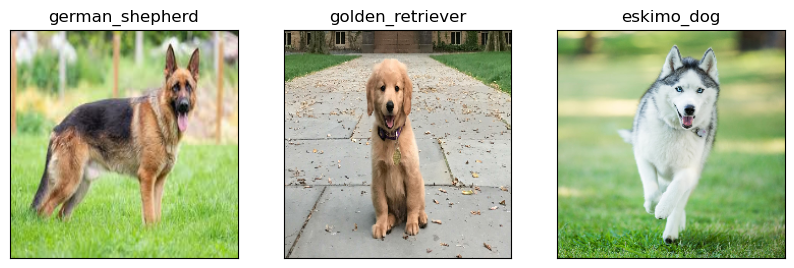

In [124]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
    plt.subplot(1, 3, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.title(custom_preds_labels[i])
    plt.imshow(image)